In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 3.9 MB/s eta 0:00:00


In [ ]:
import os
import numpy as np
from skimage.io import imread
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from lime import lime_image
from skimage.color import rgb2gray
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:


def load_images_from_drive(folder_path):
    # Montar o Google Drive

    images = []
    labels = []

    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg"):
            img_path = os.path.join(folder_path, filename)
            img = imread(img_path)
            img = resize(img, (112, 112))  # Redimensionar a imagem para o formato desejado
            images.append(img)
            labels.append(folder_path.split("/")[-1])

    return np.array(images), labels

# Caminho para a pasta no Google Drive
drive_folder_path = '/content/drive/MyDrive/MESTRADO/DATASETS/raiox'

# Carregar imagens
# loaded_images, loaded_labels = load_images_from_drive(drive_folder_path)


In [ ]:
def predict_fn(images):
    preprocessed_images = preprocess_input(np.array(images))
    return model.predict(preprocessed_images)


# Função para carregar imagens e rótulos
def load_images(folder):
    images = []
    labels = []
    folder_name = folder.split("/")[-1].lower()

    for filename in [f for f in os.listdir(folder) if f.lower().endswith(".jpeg")]:
        img_path = os.path.join(folder, filename)
        img = imread(img_path)
        img = resize(img, (224, 224))
        images.append(img)
        labels.append(folder_name)

    return images, labels

def load_and_filter_images(dataset_path, target_shape=(224, 224)):
    images, labels = load_images(dataset_path)
    filtered_images = [img for img in images if img.shape == target_shape]
    filtered_labels = [label for img, label in zip(images, labels) if img.shape == target_shape]
    return filtered_images, filtered_labels

# normal_images, normal_labels = load_and_filter_images("/content/drive/MyDrive/MESTRADO/DATASETS/raiox/NORMAL")
# pneumonia_images, pneumonia_labels = load_and_filter_images("/content/drive/MyDrive/MESTRADO/DATASETS/raiox/PNEUMONIA")



In [ ]:

# Caminho para o diretório que contém suas imagens
data_dir = '/content/drive/MyDrive/MESTRADO/DATASETS/raiox'

# Especificações do modelo VGG16
base_model = VGG16(weights=None, include_top=False, input_shape=(224, 224, 3))

# Congelar as camadas convolucionais iniciais da VGG16
for layer in base_model.layers:
    layer.trainable = False

# Permitir treinamento apenas nas últimas camadas convolucionais
for layer in base_model.layers[-4:]:
    layer.trainable = True

# Crie um modelo sequencial e adicione as camadas da VGG16
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
model.add(Dense(2, activation='softmax'))

# Ajuste do Learning Rate
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Crie geradores de dados para treinamento, validação e teste
batch_size = 64
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.3)  # Normalização e divisão dos dados em treino/teste

train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'  # Especifica que é para treinamento
)

validation_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'  # Especifica que é para validação
)

test_datagen = ImageDataGenerator(rescale=1./255)  # Normalização apenas para o conjunto de teste

test_generator = test_datagen.flow_from_directory(
    data_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Evita a mistura dos dados para garantir que o conjunto de teste não seja utilizado durante o treinamento
)

# Ajuste o modelo aos dados
epochs = 20  # Ajuste conforme necessário
train_loss_list = []
train_accuracy_list = []
val_loss_list = []
val_accuracy_list = []

for epoch in range(epochs):
    print(f'Epoch {epoch + 1}/{epochs}')

    # Treinamento do modelo
    history = model.fit(
        train_generator,
        epochs=1,
        verbose=1,
        validation_data=validation_generator
    )

    # Salve os valores de treinamento e validação
    train_loss_list.append(history.history['loss'][0])
    train_accuracy_list.append(history.history['accuracy'][0])
    val_loss_list.append(history.history['val_loss'][0])
    val_accuracy_list.append(history.history['val_accuracy'][0])

# Avalie o modelo no conjunto de teste
test_loss, test_accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Plote e salve os gráficos de acurácia e perda
plt.figure(figsize=(12, 6))

# Gráfico de Acurácia
plt.subplot(1, 2, 1)
plt.plot(train_accuracy_list, label='Train Accuracy')
plt.plot(val_accuracy_list, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Gráfico de Perda
plt.subplot(1, 2, 2)
plt.plot(train_loss_list, label='Train Loss')
plt.plot(val_loss_list, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Salvar os gráficos em um arquivo
plt.savefig('/content/drive/MyDrive/MESTRADO/DATASETS/raiox/training_plots.png')
plt.show()


Found 2206 images belonging to 2 classes.
Found 944 images belonging to 2 classes.
Found 3150 images belonging to 2 classes.
Epoch 1/20
35/35 [==============================] - 583s 16s/step - loss: 6.0133 - accuracy: 0.4982 - val_loss: 4.6959 - val_accuracy: 0.5000
Epoch 2/20
35/35 [==============================] - 55s 2s/step - loss: 3.8523 - accuracy: 0.6496 - val_loss: 3.1161 - val_accuracy: 0.6992
Epoch 3/20
35/35 [==============================] - 49s 1s/step - loss: 2.6379 - accuracy: 0.8291 - val_loss: 2.2608 - val_accuracy: 0.8951
Epoch 4/20
35/35 [==============================] - 48s 1s/step - loss: 2.0615 - accuracy: 0.8817 - val_loss: 1.8684 - val_accuracy: 0.9100
Epoch 5/20
35/35 [==============================] - 55s 2s/step - loss: 1.7929 - accuracy: 0.8935 - val_loss: 1.7306 - val_accuracy: 0.8845
Epoch 6/20
35/35 [==============================] - 49s 1s/step - loss: 1.5877 - accuracy: 0.9157 - val_loss: 1.5060 - val_accuracy: 0.9131
Epoch 7/20
35/35 [===============

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 475ms/step
Classificação person1885_bacteria_4772.jpeg: 0, Porcentagem de Certeza: 100.00%



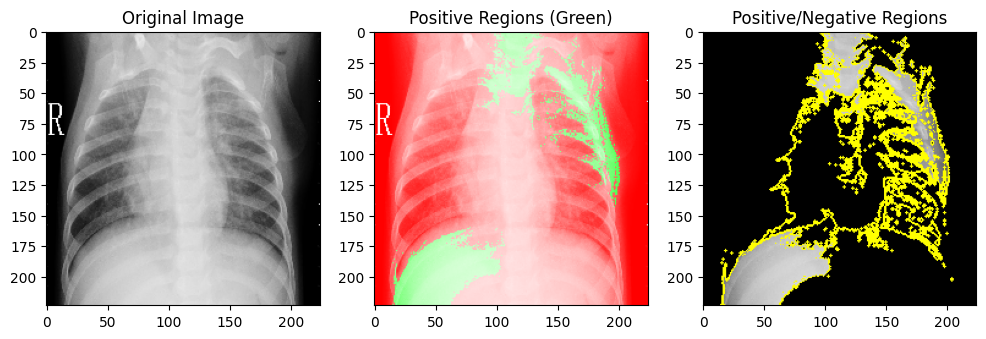

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step
Classificação person1869_bacteria_4745.jpeg: 0, Porcentagem de Certeza: 100.00%



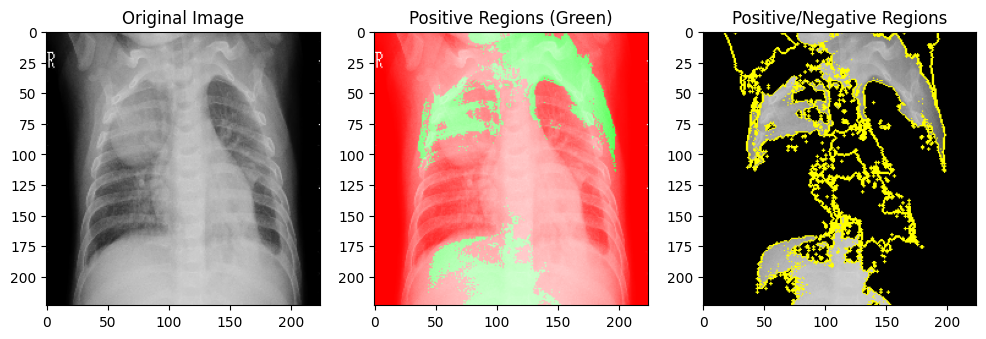

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step
Classificação person264_bacteria_1231.jpeg: 1, Porcentagem de Certeza: 100.00%



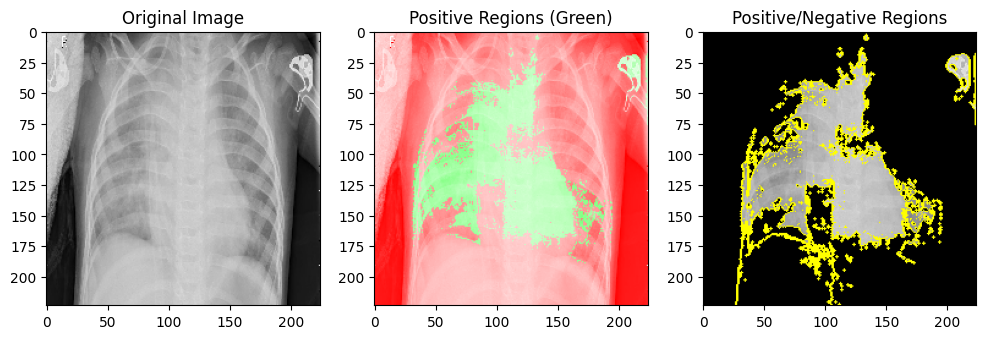

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step
Classificação person266_bacteria_1248.jpeg: 1, Porcentagem de Certeza: 100.00%



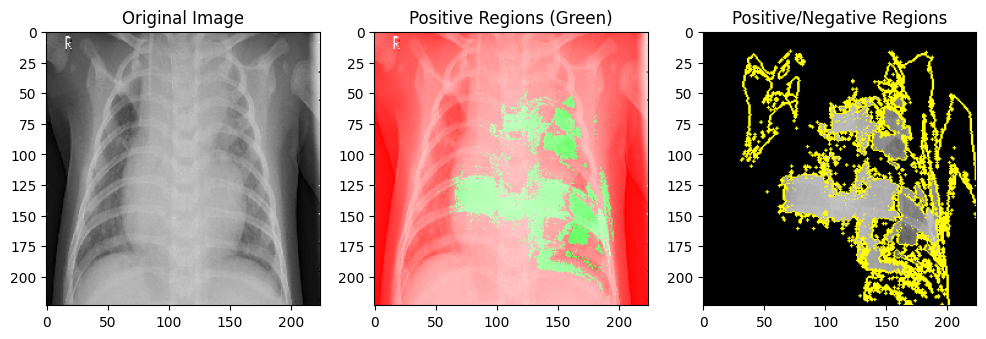

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step
Classificação person1886_bacteria_4773.jpeg: 1, Porcentagem de Certeza: 100.00%



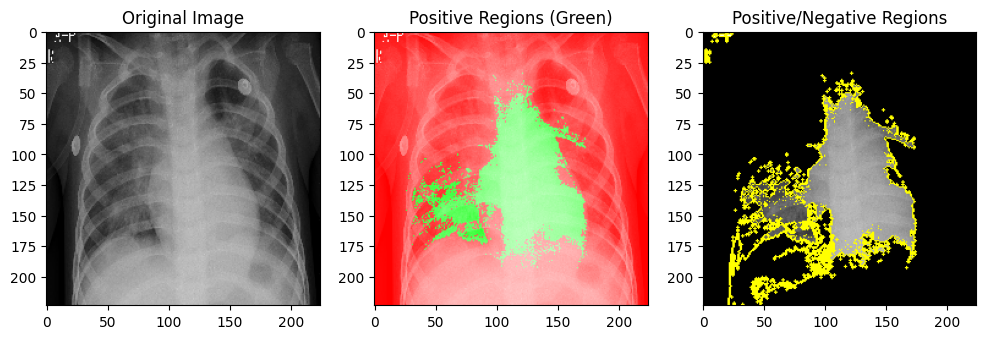

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step
Classificação person23_bacteria_91.jpeg: 1, Porcentagem de Certeza: 100.00%



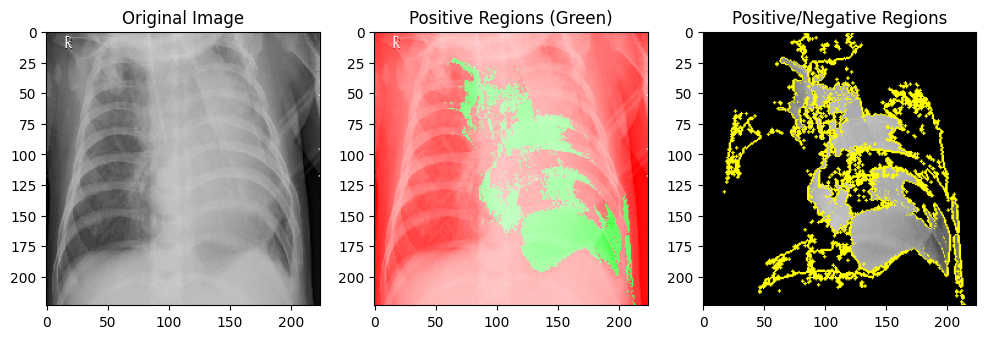

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step
Classificação person1864_bacteria_4736.jpeg: 0, Porcentagem de Certeza: 100.00%



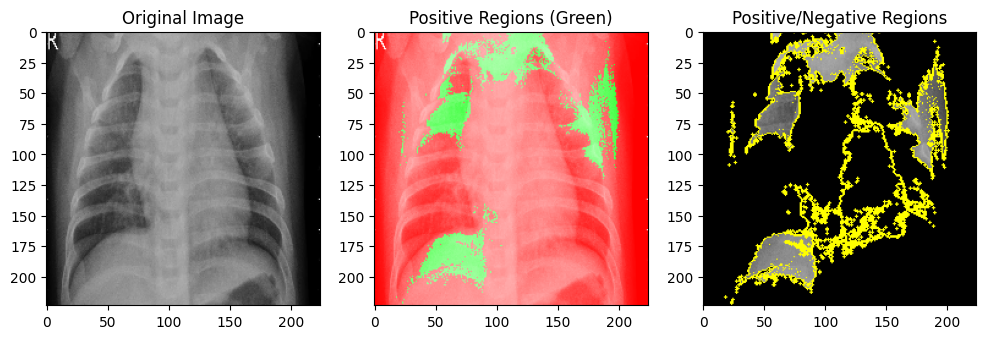

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step
Classificação person20_bacteria_64.jpeg: 1, Porcentagem de Certeza: 100.00%



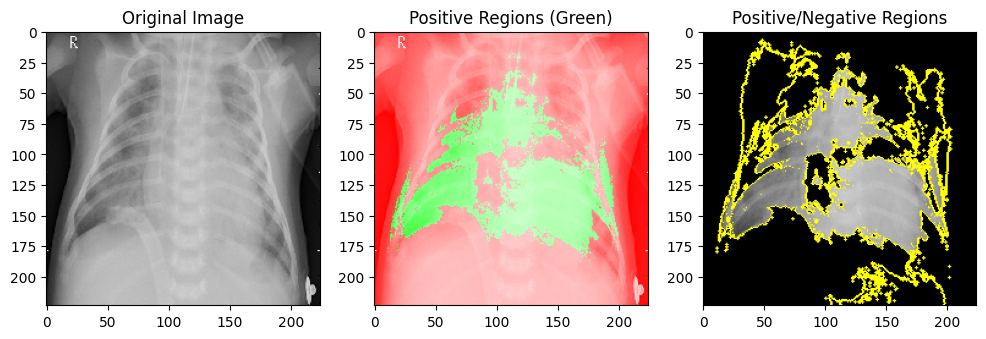

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step
Classificação person20_bacteria_70.jpeg: 1, Porcentagem de Certeza: 100.00%



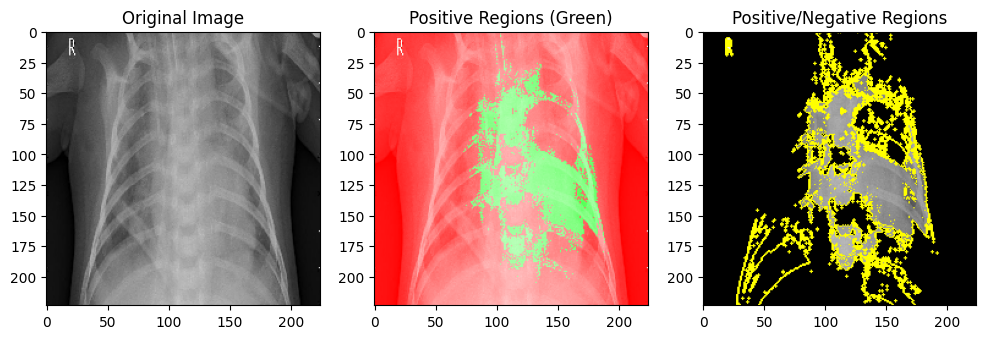

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step
Classificação person19_bacteria_59.jpeg: 1, Porcentagem de Certeza: 100.00%



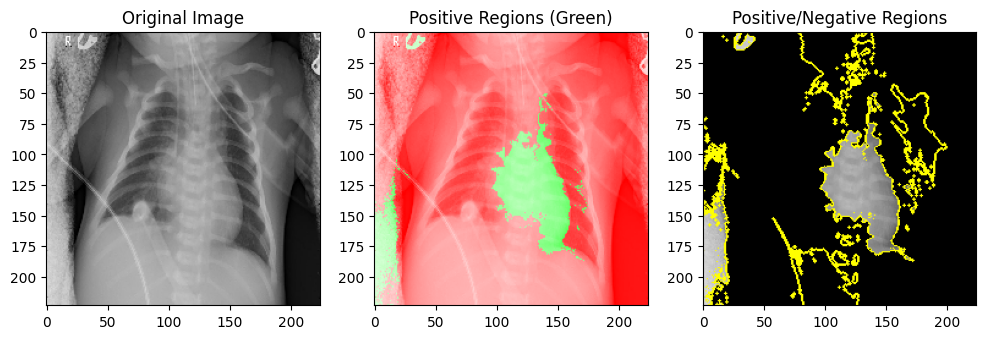

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step
Classificação person265_virus_548.jpeg: 0, Porcentagem de Certeza: 100.00%



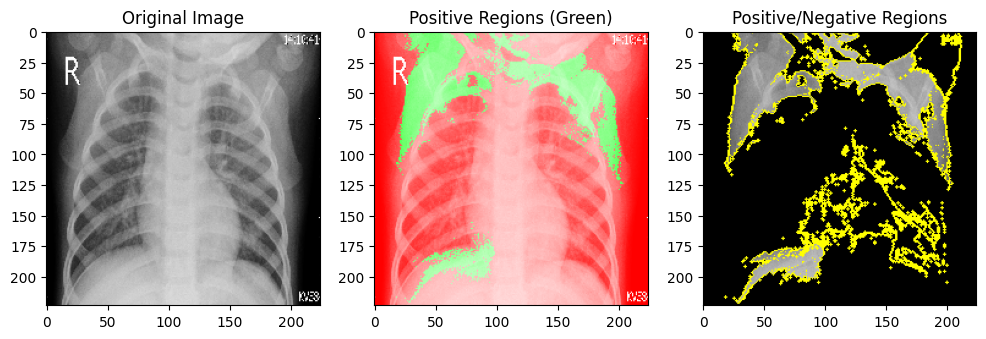

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 18ms/step
Classificação person23_bacteria_95.jpeg: 1, Porcentagem de Certeza: 100.00%



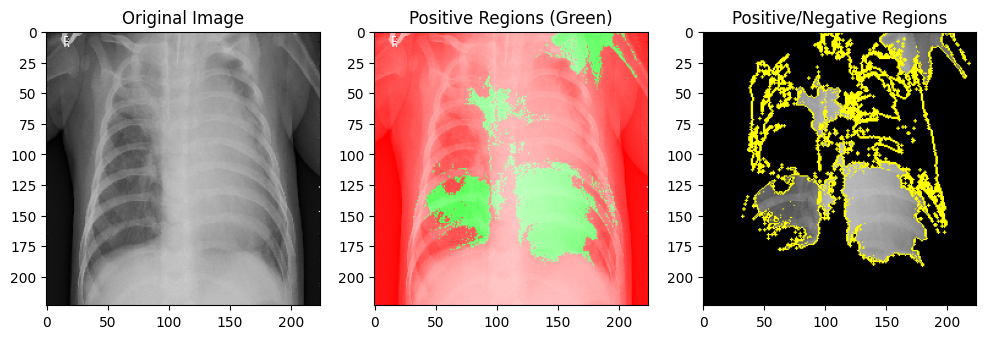

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 66ms/step
Classificação person266_bacteria_1245.jpeg: 1, Porcentagem de Certeza: 100.00%



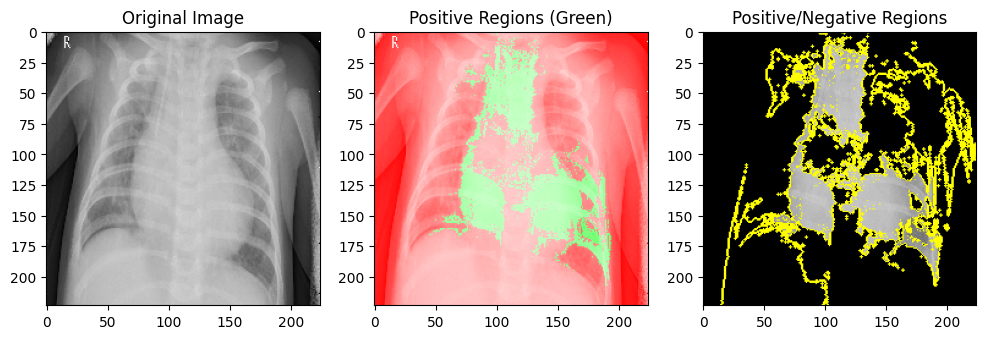

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step
Classificação person1933_bacteria_4844.jpeg: 1, Porcentagem de Certeza: 100.00%



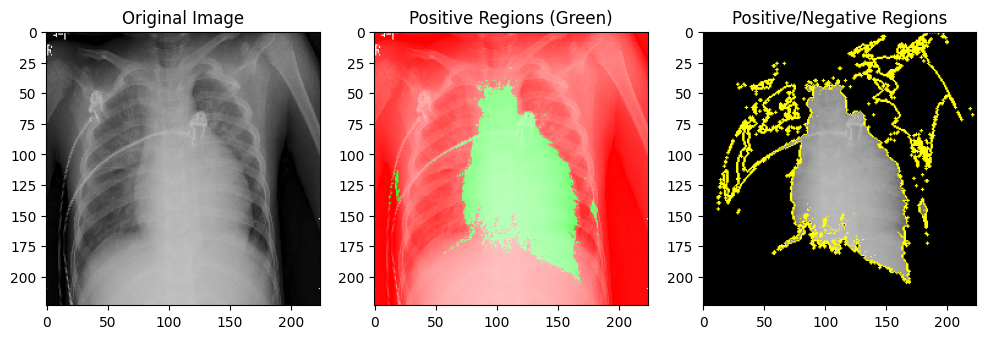

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step
Classificação person1918_bacteria_4825.jpeg: 0, Porcentagem de Certeza: 100.00%



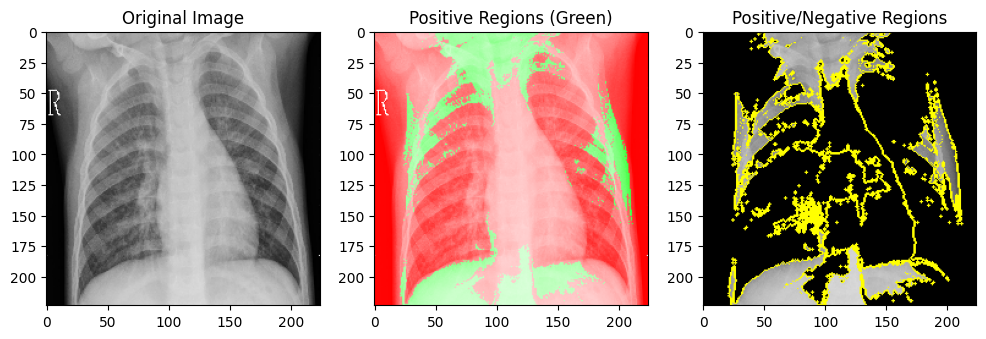

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step
Classificação person23_bacteria_83.jpeg: 1, Porcentagem de Certeza: 100.00%



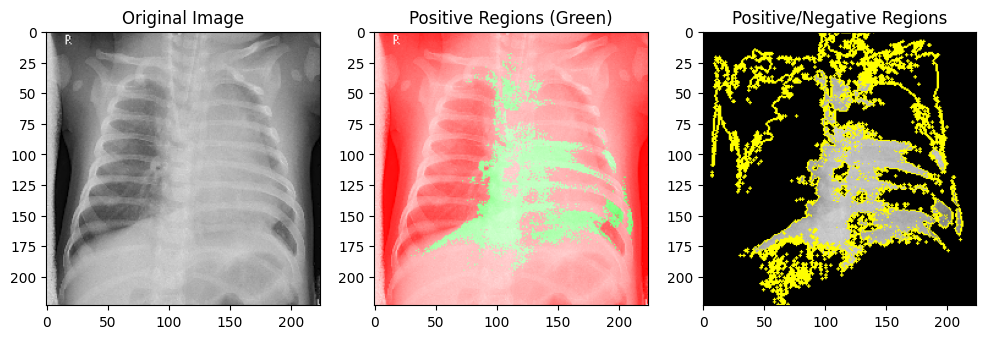

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 53ms/step
Classificação person1922_bacteria_4830.jpeg: 0, Porcentagem de Certeza: 100.00%



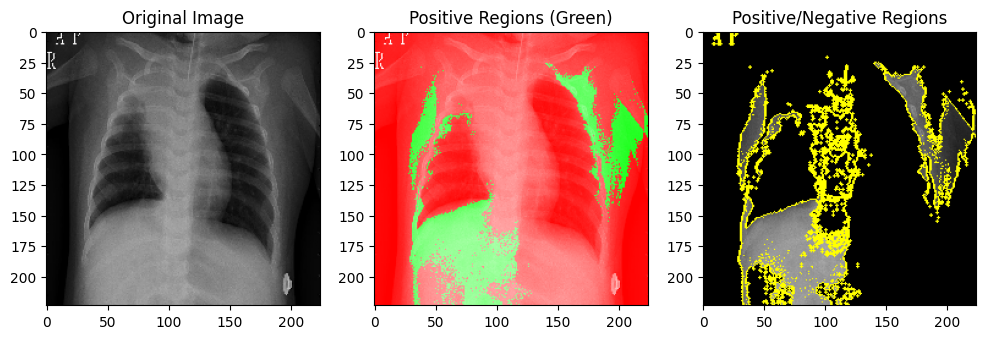

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step
Classificação person1880_bacteria_4765.jpeg: 0, Porcentagem de Certeza: 100.00%



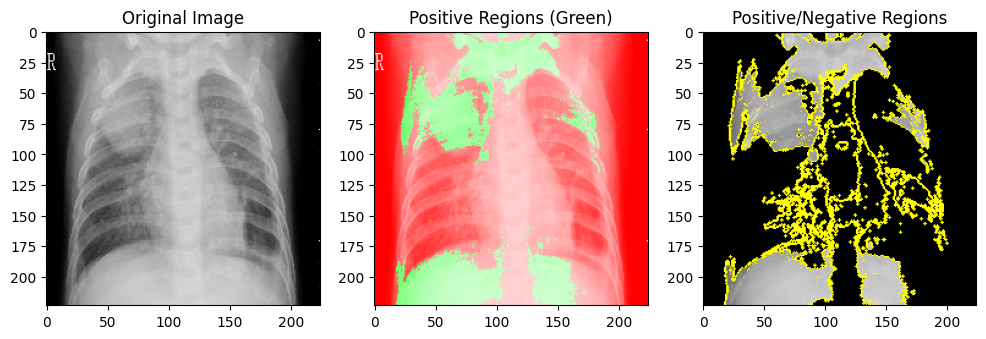

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step
Classificação person23_bacteria_105.jpeg: 1, Porcentagem de Certeza: 100.00%



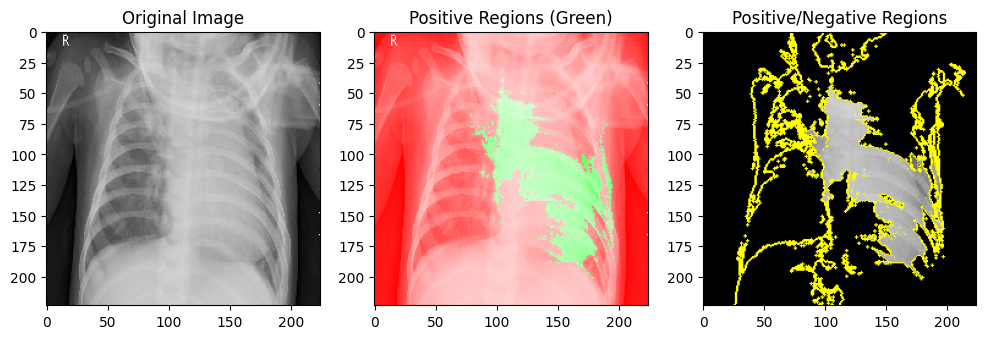

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step
Classificação person23_bacteria_93.jpeg: 1, Porcentagem de Certeza: 100.00%



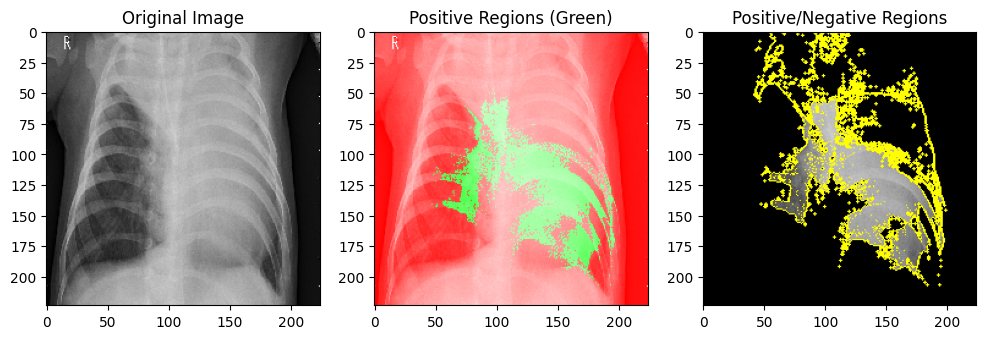

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 58ms/step
Classificação person19_bacteria_62.jpeg: 1, Porcentagem de Certeza: 100.00%



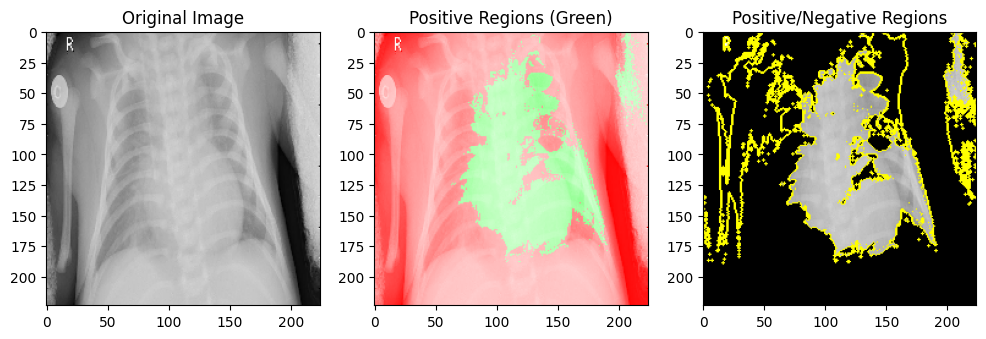

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step
Classificação person1863_bacteria_4735.jpeg: 1, Porcentagem de Certeza: 100.00%



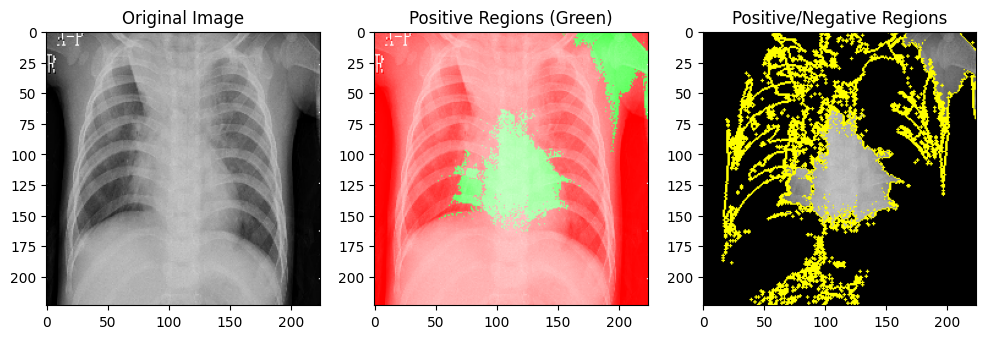

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step
Classificação person1850_bacteria_4721.jpeg: 1, Porcentagem de Certeza: 100.00%



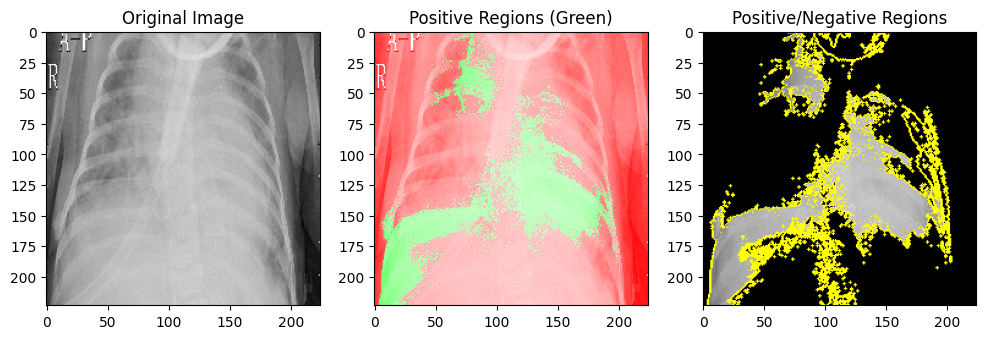

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step
Classificação person24_bacteria_110.jpeg: 1, Porcentagem de Certeza: 100.00%



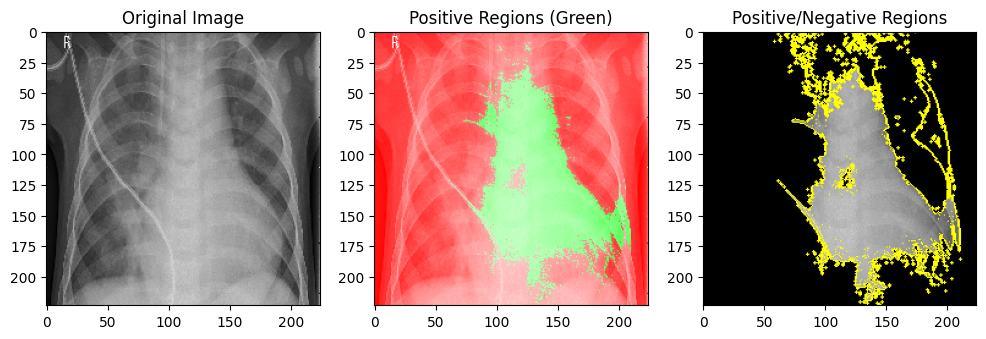

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step
Classificação person25_bacteria_118.jpeg: 1, Porcentagem de Certeza: 100.00%



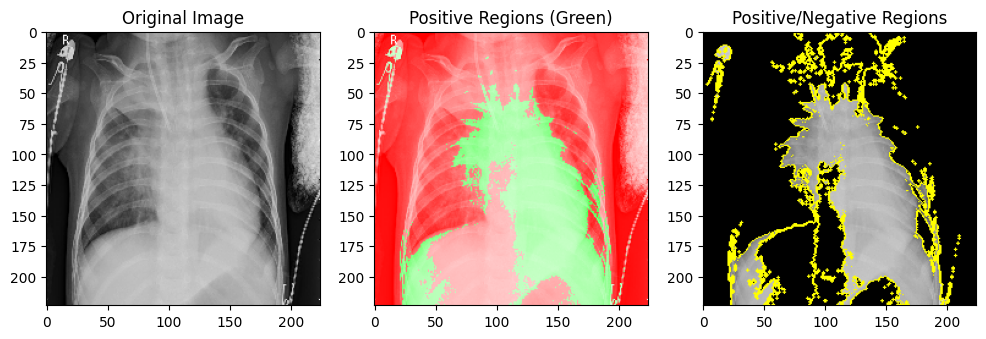

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step
Classificação person23_bacteria_106.jpeg: 1, Porcentagem de Certeza: 100.00%



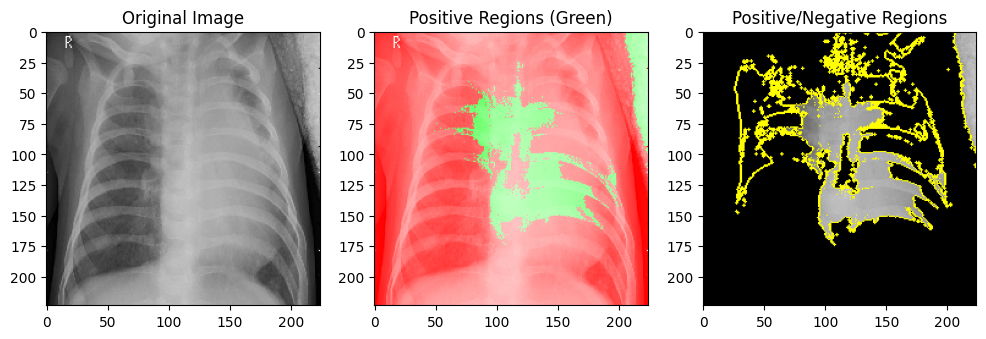

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step
Classificação person23_bacteria_97.jpeg: 1, Porcentagem de Certeza: 100.00%



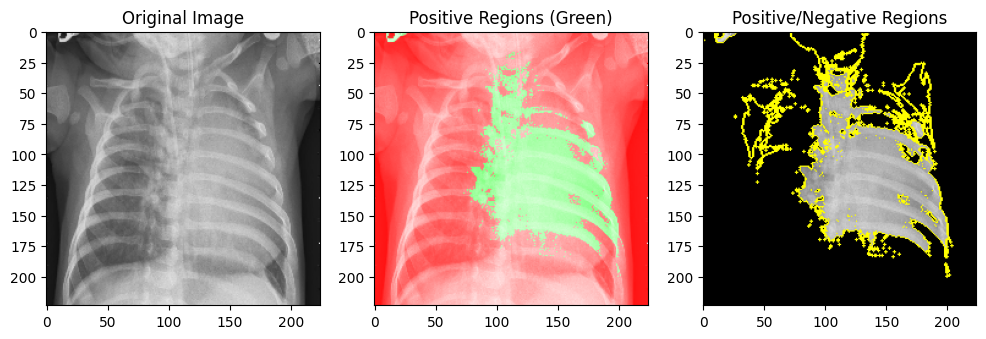

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step
Classificação person1851_bacteria_4722.jpeg: 1, Porcentagem de Certeza: 100.00%



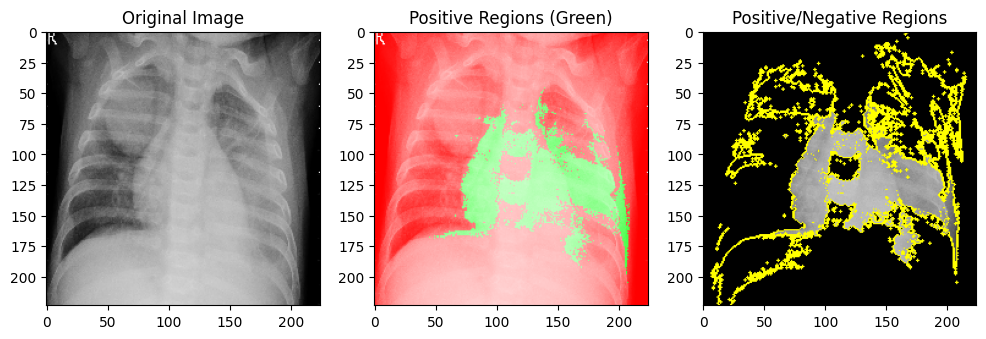

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step
Classificação person1835_bacteria_4699.jpeg: 1, Porcentagem de Certeza: 100.00%



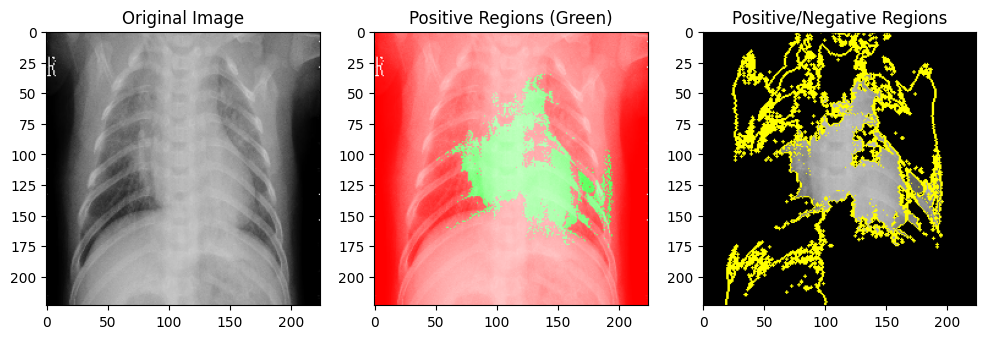

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step
Classificação person1896_bacteria_4788.jpeg: 1, Porcentagem de Certeza: 100.00%



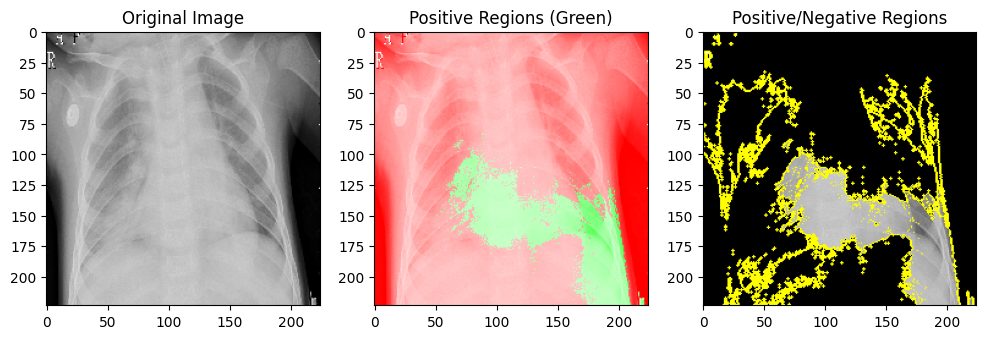

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step
Classificação person274_bacteria_1288.jpeg: 1, Porcentagem de Certeza: 100.00%



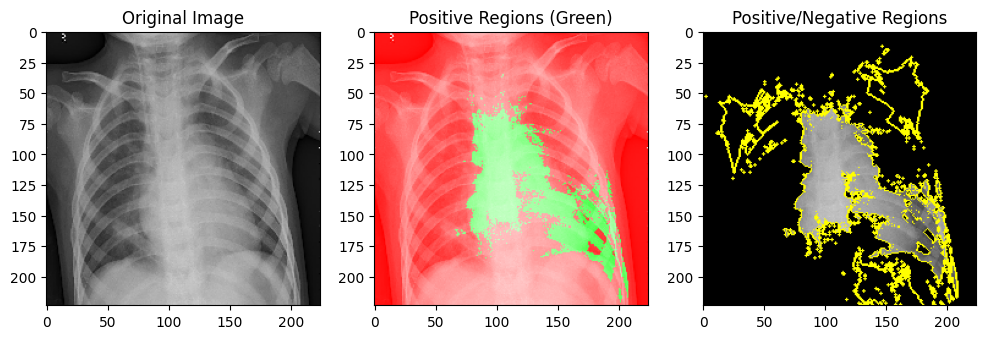

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step
Classificação person20_bacteria_67.jpeg: 1, Porcentagem de Certeza: 100.00%



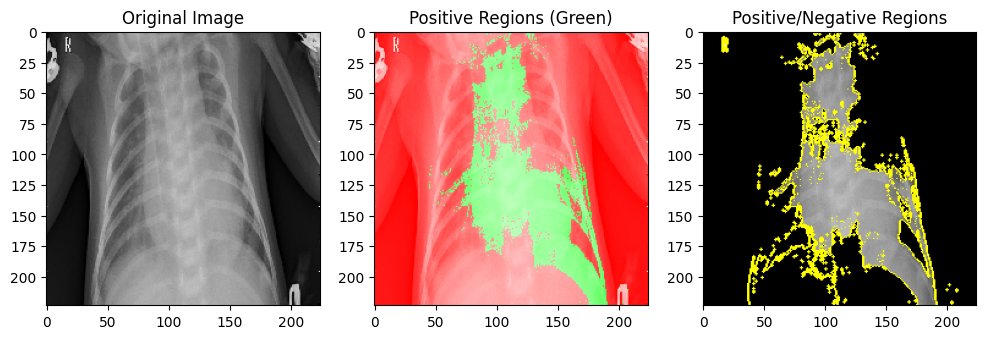

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step
Classificação person273_virus_561.jpeg: 0, Porcentagem de Certeza: 100.00%



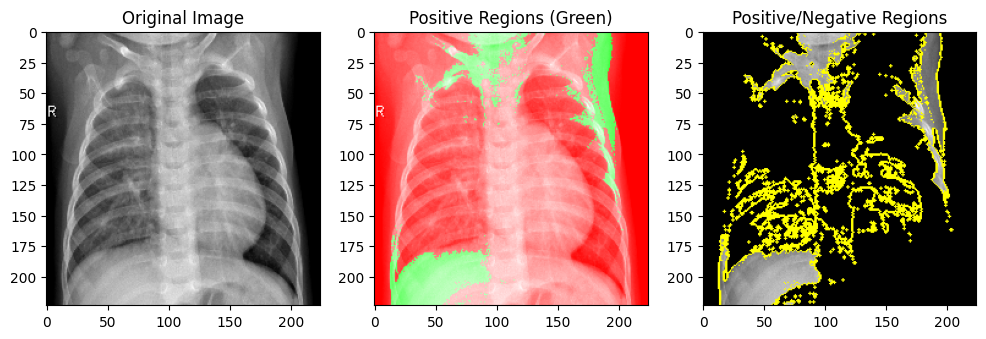

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step
Classificação person275_bacteria_1293.jpeg: 1, Porcentagem de Certeza: 100.00%



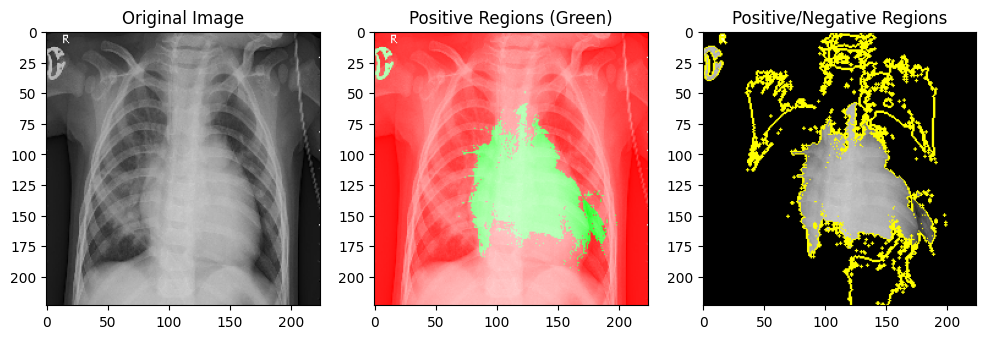

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step
Classificação person1857_bacteria_4729.jpeg: 1, Porcentagem de Certeza: 100.00%



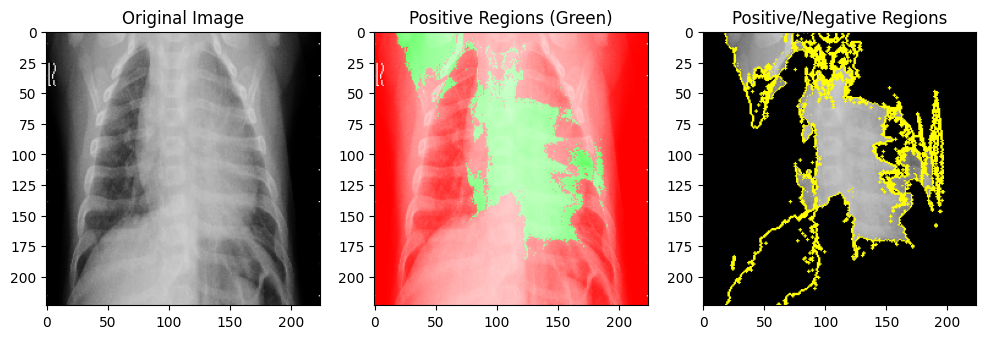

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step
Classificação person25_bacteria_119.jpeg: 1, Porcentagem de Certeza: 100.00%



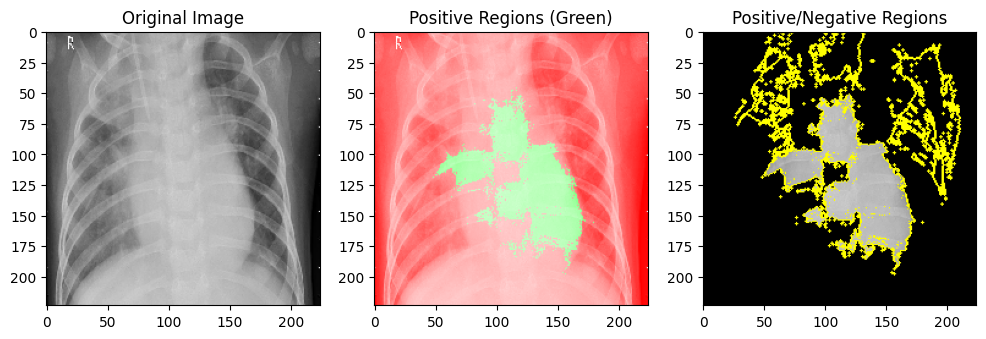

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 67ms/step
Classificação person1847_bacteria_4716.jpeg: 0, Porcentagem de Certeza: 100.00%



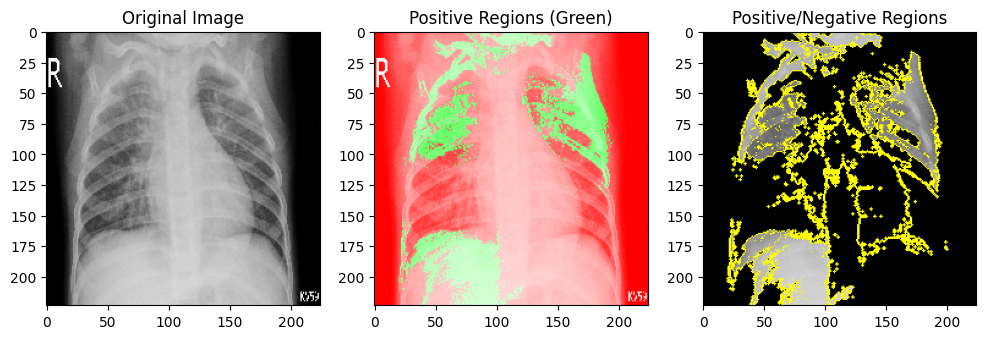

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step
Classificação person267_bacteria_1253.jpeg: 0, Porcentagem de Certeza: 100.00%



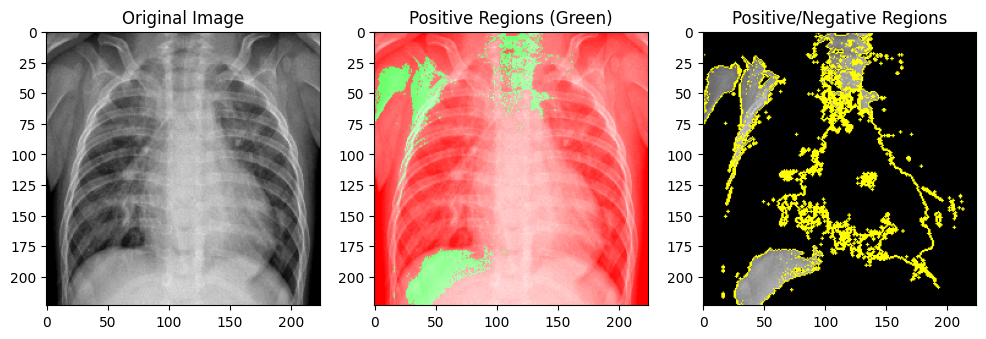

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step
Classificação person19_bacteria_58.jpeg: 1, Porcentagem de Certeza: 100.00%



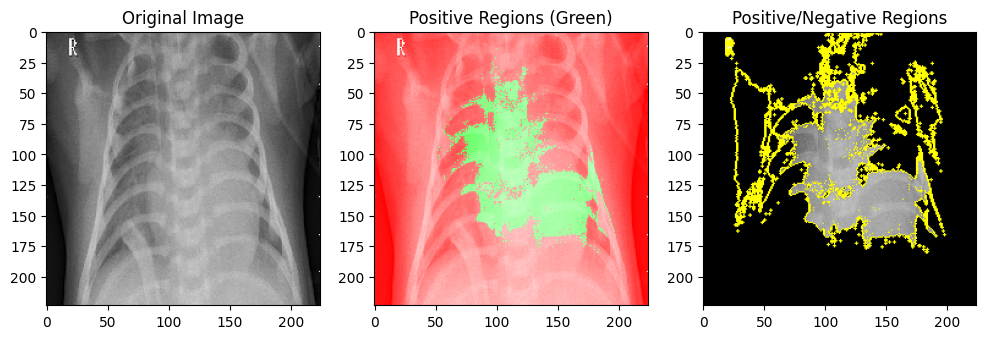

In [ ]:
# ...

# Loop sobre as imagens
image_names = os.listdir("/content/drive/MyDrive/MESTRADO/DATASETS/raiox/NORMAL")[:300] # Substitua pelos nomes reais de suas imagens

explainer = lime_image.LimeImageExplainer()


for image_name in image_names:
    # Carregar a imagem
    image_path = os.path.join("/content/drive/MyDrive/MESTRADO/DATASETS/raiox/NORMAL", image_name)
    image = load_img(image_path, target_size=(224, 224))
    image_array = img_to_array(image)
    image_array = np.expand_dims(image_array, axis=0)

    # Gerar explicação
    explanation = explainer.explain_instance(image_array[0], model.predict, top_labels=2, hide_color=0, num_samples=1000)

    # Obter imagens e máscaras
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10, hide_rest=True)
    image_boundry1 = mark_boundaries(image_array[0] / 255.0 * (mask[..., None] > 0.5), mask)

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    image_boundry2 = mark_boundaries(image_array[0] / 255.0 * (mask[..., None] > 0.5), mask)

    # Criar uma máscara para regiões positivas (verde) e negativas (vermelho)
    positive_mask = mask > 0.5
    negative_mask = mask <= 0.5

    # Aplicar cores diferentes para regiões positivas e negativas
    image_array_colored = np.copy(image_array[0] / 255.0)
    image_array_colored[positive_mask, 1] = 1.0  # Componente verde para regiões positivas
    image_array_colored[negative_mask, 0] = 1.0  # Componente vermelho para regiões negativas

    # Visualizar as imagens com a explicação
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(image_array[0] / 255.0)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(image_array_colored)
    plt.title('Positive Regions (Green)')

    plt.subplot(1, 3, 3)
    plt.imshow(image_boundry2)
    plt.title('Positive/Negative Regions')

    # Classificação e porcentagem de certeza
    predictions = model.predict(image_array)
    predicted_class = np.argmax(predictions)
    confidence = predictions[0, predicted_class] * 100
    print(f"Classificação {image_name}: {predicted_class}, Porcentagem de Certeza: {confidence:.2f}%\n")

    plt.show()

# CT

58889256/58889256 [==============================] - 0s 0us/step
Epoch 1/100
155/155 - 11s - loss: 1.7486 - accuracy: 0.3355 - val_loss: 1.0422 - val_accuracy: 0.3846 - 11s/epoch - 74ms/step
Epoch 2/100
155/155 - 3s - loss: 0.9607 - accuracy: 0.4839 - val_loss: 0.8944 - val_accuracy: 0.7500 - 3s/epoch - 18ms/step
Epoch 3/100
155/155 - 3s - loss: 0.8873 - accuracy: 0.6194 - val_loss: 0.8235 - val_accuracy: 0.6250 - 3s/epoch - 18ms/step
Epoch 4/100
155/155 - 3s - loss: 0.8437 - accuracy: 0.6258 - val_loss: 0.7977 - val_accuracy: 0.6442 - 3s/epoch - 16ms/step
Epoch 5/100
155/155 - 2s - loss: 0.8034 - accuracy: 0.5871 - val_loss: 0.7495 - val_accuracy: 0.6731 - 2s/epoch - 15ms/step
Epoch 6/100
155/155 - 2s - loss: 0.7818 - accuracy: 0.6065 - val_loss: 0.7155 - val_accuracy: 0.6538 - 2s/epoch - 14ms/step
Epoch 7/100
155/155 - 3s - loss: 0.7437 - accuracy: 0.6645 - val_loss: 0.7854 - val_accuracy: 0.8077 - 3s/epoch - 17ms/step
Epoch 8/100
155/155 - 2s - loss: 0.7025 - accuracy: 0.6581 - val_

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


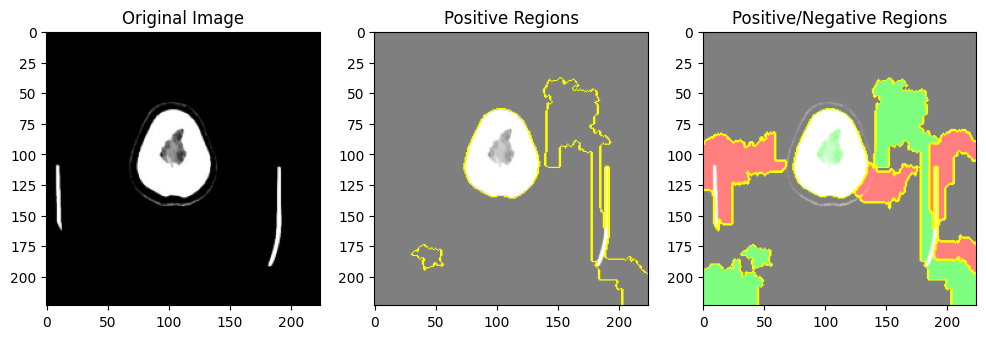

In [ ]:
import os
# Função para carregar imagens e rótulos
def load_images(folder):
    images = []
    labels = []
    for filename in os.listdir(folder):
        if filename.endswith(".jpg"):
            img = imread(os.path.join(folder, filename))
            img = resize(img, (224, 224))  # Redimensionar a imagem para o formato desejado
            images.append(img)
            labels.append(folder.split("/")[-1])
    return images, labels

# Carregar imagens e rótulos
aneurysm_images, aneurysm_labels = load_images("/content/drive/MyDrive/MESTRADO/DATASETS/files/aneurysm")
cancer_images, cancer_labels = load_images("/content/drive/MyDrive/MESTRADO/DATASETS/files/cancer")
tumor_images, tumor_labels = load_images("/content/drive/MyDrive/MESTRADO/DATASETS/files/tumor")

# Concatenar dados
images = np.concatenate([aneurysm_images, cancer_images, tumor_images])
labels = np.concatenate([aneurysm_labels, cancer_labels, tumor_labels])

# Codificar rótulos
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)

# Dividir os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(images, labels_encoded, test_size=0.4, random_state=42)

# Carregar modelo VGG16 pré-treinado sem as camadas densas (incluindo a camada de predição)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Congelar as camadas convolucionais do modelo VGG16
for layer in base_model.layers:
    layer.trainable = False

# Adicionar camadas personalizadas para a classificação
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(units=128, activation='relu'))
model.add(Dense(units=3, activation='softmax'))  # 3 classes: aneurysm, cancer, tumor

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Treinar o modelo
model.fit(preprocess_input(np.array(X_train)), y_train, epochs=100, batch_size=1, validation_data=(preprocess_input(np.array(X_test)), y_test), verbose=2)

# Função para prever a classe usando o modelo treinado
def predict_fn(images):
    preprocessed_images = preprocess_input(np.array(images))
    return model.predict(preprocessed_images)

explainer = lime_image.LimeImageExplainer()

# Selecionar uma instância de teste para explicar
image_to_explain = X_test[0]
explanation = explainer.explain_instance(image_to_explain, predict_fn, top_labels=3, hide_color=0, num_samples=1000)

# Imprimir e visualizar a explicação
from skimage.segmentation import mark_boundaries

temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
image_boundry1 = mark_boundaries(temp / 2 + 0.5, mask)

temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
image_boundry2 = mark_boundaries(temp / 2 + 0.5, mask)

# Visualizar as imagens com a explicação
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(image_to_explain)
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(image_boundry1)
plt.title('Positive Regions')

plt.subplot(1, 3, 3)
plt.imshow(image_boundry2)
plt.title('Positive/Negative Regions')

plt.show()


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


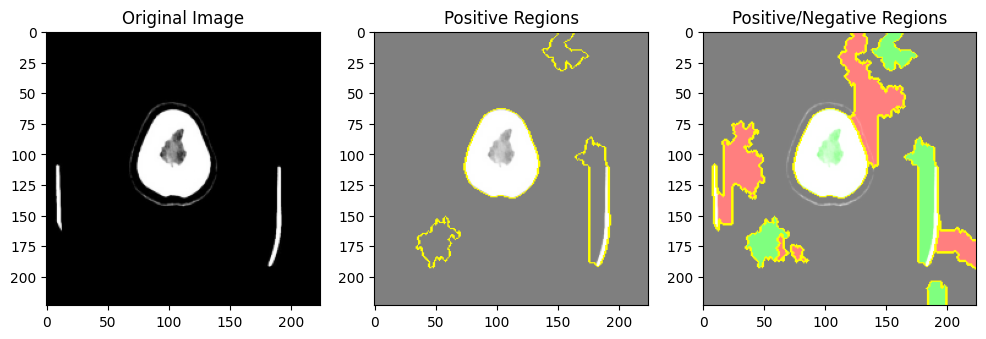

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


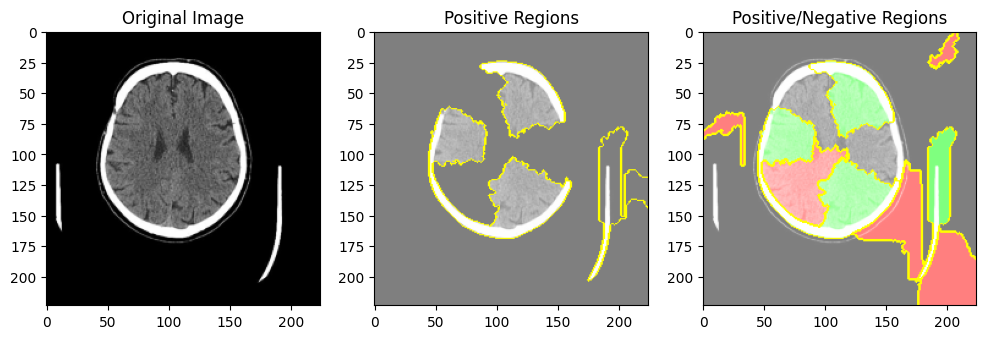

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


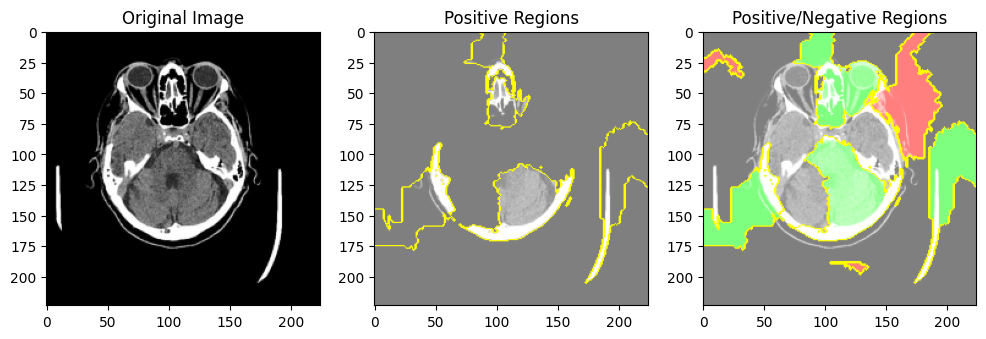

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


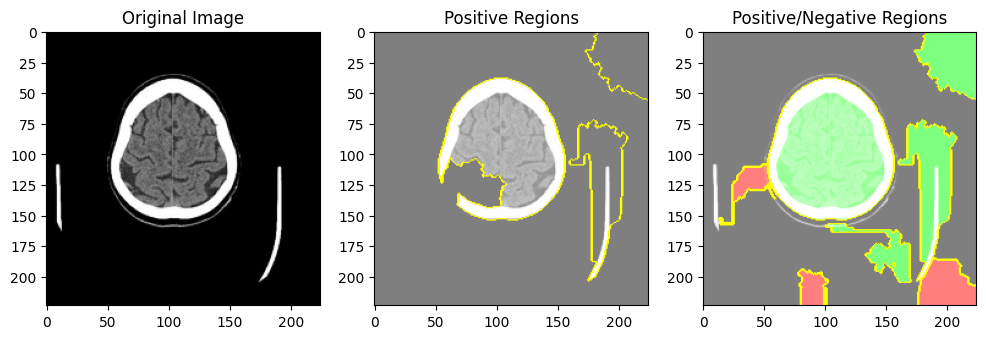

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


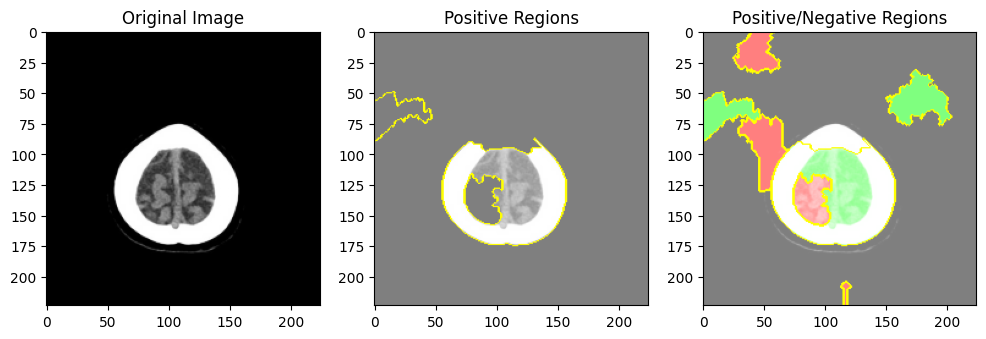

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


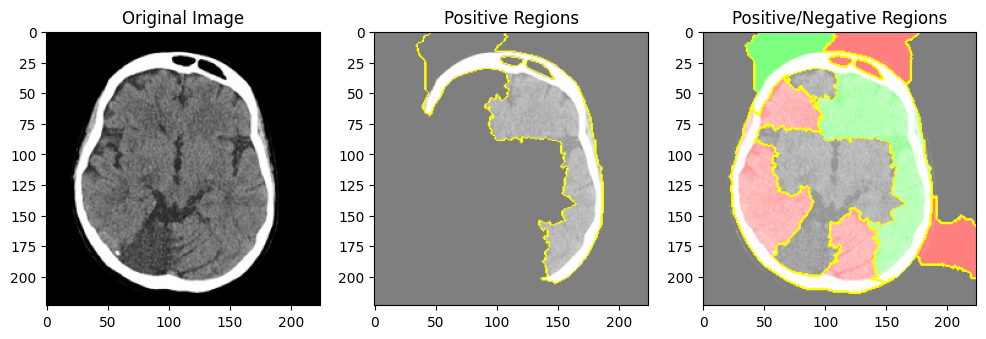

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


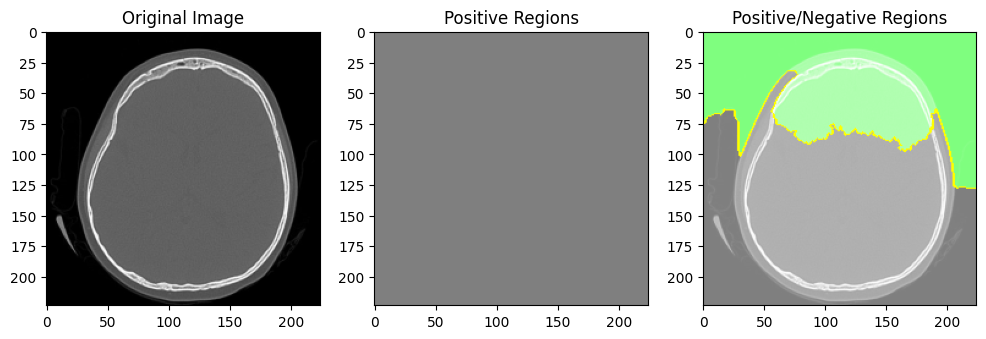

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


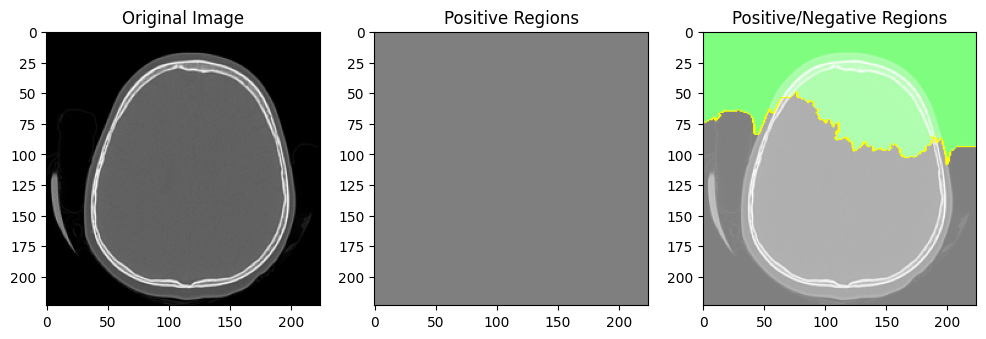

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


KeyboardInterrupt: ignored

In [ ]:
# Importar bibliotecas necessárias
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt

# Número de imagens para explicar
num_images = 20

# Loop sobre as imagens
for i in range(num_images):
    # Substitua X_test pelo seu conjunto de dados de teste
    image_to_explain = X_test[i]

    # Gerar explicação
    explanation = explainer.explain_instance(image_to_explain, predict_fn, top_labels=3, hide_color=0, num_samples=1000)

    # Obter imagens e máscaras
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
    image_boundry1 = mark_boundaries(temp / 2 + 0.5, mask)

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
    image_boundry2 = mark_boundaries(temp / 2 + 0.5, mask)

    # Visualizar as imagens com a explicação
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(image_to_explain)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(image_boundry1)
    plt.title('Positive Regions')

    plt.subplot(1, 3, 3)
    plt.imshow(image_boundry2)
    plt.title('Positive/Negative Regions')

    plt.show()
